In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
len(model.parameters_rules())

105

In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/normal_priors_sd3_nothin')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_12chain_normal_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_dreamzs_12chain_normal_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_12chain_normal_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_dreamzs_12chain_normal_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-2206.77153948]
 [-2206.77153948]
 [-2206.77153948]
 ..., 
 [  160.90013926]
 [  160.90013926]
 [  160.90013926]]
Logp of trace:  a  chain:  1  =  [ 162.80207024]
Logp of trace:  a  chain:  2  =  [ 154.69243397]
Logp of trace:  a  chain:  3  =  [ 151.28785371]
Logp of trace:  a  chain:  4  =  [ 158.41254725]
Logp of trace:  a  chain:  5  =  [ 133.22573495]
Logp of trace:  a  chain:  6  =  [ 151.48240521]
Logp of trace:  a  chain:  7  =  [ 159.45808704]
Logp of trace:  a  chain:  8  =  [ 159.6942536]
Logp of trace:  a  chain:  9  =  [ 158.37784612]
Logp of trace:  a  chain:  10  =  [ 152.06238243]
Logp of trace:  a  chain:  11  =  [ 148.8918754]
Logp of trace:  b  chain: 0 =  [[-2123.51341221]
 [ -162.90742506]
 [ -162.90742506]
 ..., 
 [  155.5350399 ]
 [  155.5350399 ]
 [  155.5350399 ]]
Logp of trace:  b  chain:  1  =  [ 152.84817801]
Logp of trace:  b  chain:  2  =  [ 148.7732905]
Logp of trace:  b  chain:  3  =  [ 152.71996972]
Logp of trace:  b  ch

In [6]:
traces['b'][0][:,72]

array([-1.05226592, -0.67609599, -0.67609599, ..., -0.05442665,
       -0.05442665, -0.05442665])

In [7]:
traces['a'][0][:,72]

array([-1.163183  , -1.163183  , -1.163183  , ..., -0.38856736,
       -0.38856736, -0.38856736])

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  16  of  105  parameters.
Percent of parameters with GR below 1.2:  15.2380952381
Number of parameters with GR below 1.1:  1  of  105  parameters.
Percent of parameters with GR below 1.1:  0.952380952381


[16, 15.238095238095239, 1, 0.9523809523809524]

In [10]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  44  of  105  parameters.
Percent of parameters with GR below 1.2:  41.9047619048
Number of parameters with GR below 1.1:  7  of  105  parameters.
Percent of parameters with GR below 1.1:  6.66666666667


[44, 41.904761904761905, 7, 6.666666666666667]

In [11]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  27  of  105  parameters.
Percent of parameters with GR below 1.2:  25.7142857143
Number of parameters with GR below 1.1:  1  of  105  parameters.
Percent of parameters with GR below 1.1:  0.952380952381


[27, 25.71428571428571, 1, 0.9523809523809524]

In [12]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  37  of  105  parameters.
Percent of parameters with GR below 1.2:  35.2380952381
Number of parameters with GR below 1.1:  6  of  105  parameters.
Percent of parameters with GR below 1.1:  5.71428571429


[37, 35.23809523809524, 6, 5.714285714285714]

In [13]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-6.23108836, -6.23108836, -6.23108836, ..., -7.93843788,
        -7.93843788, -7.93843788]),
 array([-5.97941552, -5.97941552, -5.97941552, ..., -6.66931154,
        -6.66931154, -6.66931154]),
 array([-6.34887731, -6.59485773, -6.59485773, ..., -7.23889621,
        -7.23889621, -7.23889621]),
 array([-6.16238398, -6.16238398, -6.16238398, ..., -8.18691019,
        -8.18691019, -8.18691019]),
 array([-6.46650105, -6.46650105, -6.46650105, ..., -6.0409664 ,
        -6.0409664 , -6.0409664 ]),
 array([-5.75630354, -5.75630354, -5.75630354, ..., -8.20905845,
        -8.20905845, -8.20905845]),
 array([-6.38744785, -6.23619542, -6.23619542, ..., -7.99097188,
        -7.99097188, -7.99097188]),
 array([-6.33949949, -6.33949949, -6.33949949, ..., -7.16316357,
        -7.16316357, -7.16316357]),
 array([-6.3132597 , -6.3132597 , -6.3132597 , ..., -4.98991353,
        -4.98991353, -4.98991353]),
 array([-6.24737486, -6.24737486, -6.24737486, ..., -6.41371792,
        -6.41371792, -6.41

50000
12
50000


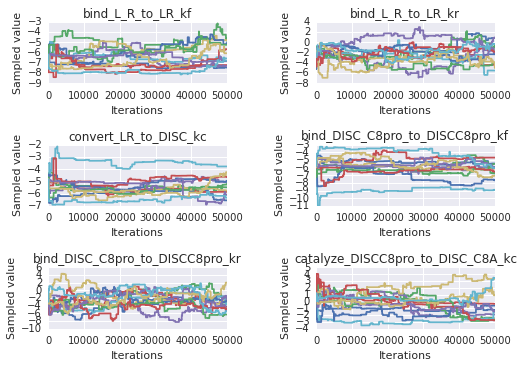

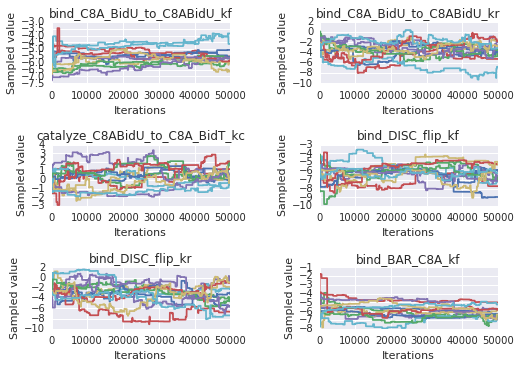

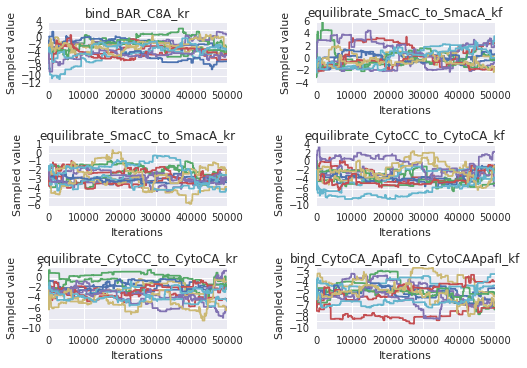

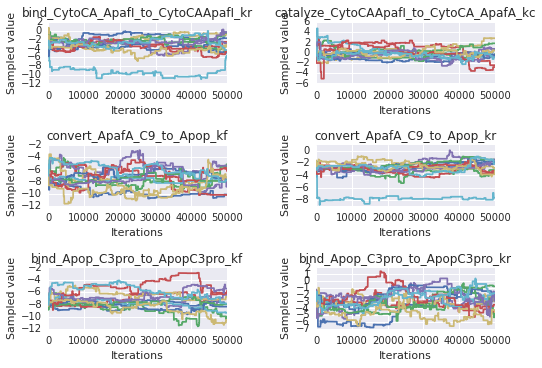

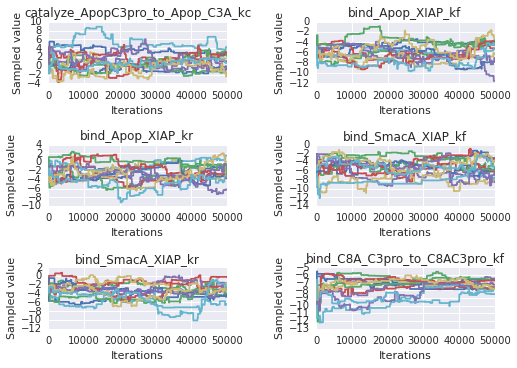

...

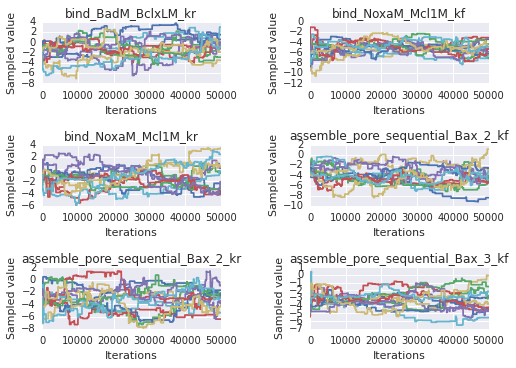

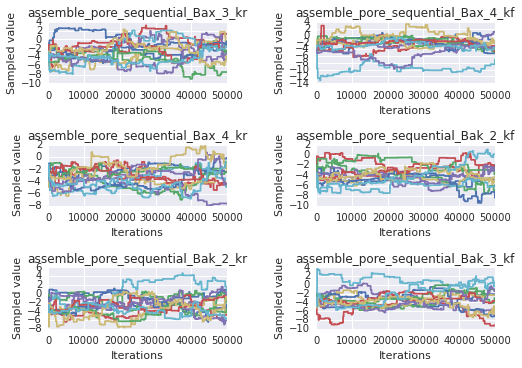

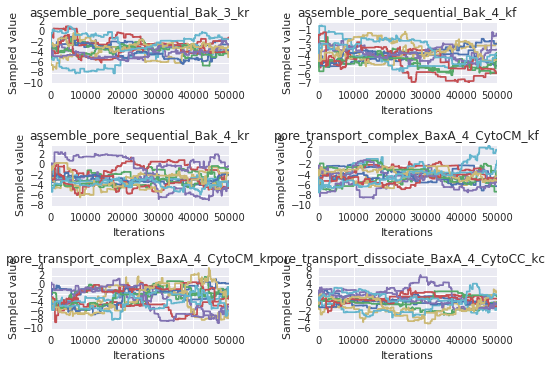

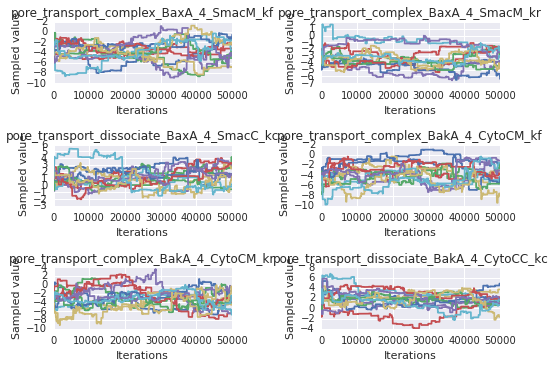

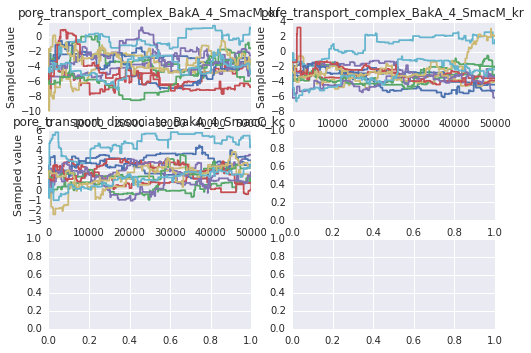

In [14]:
sample_plots(param_trace_dicts['a'])

In [15]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


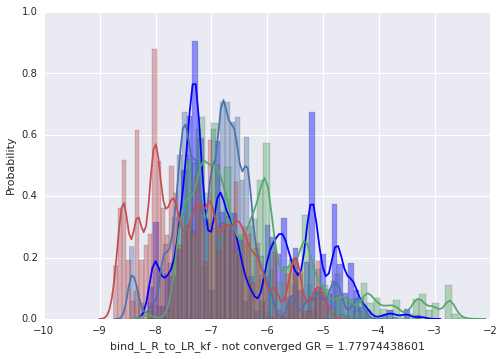

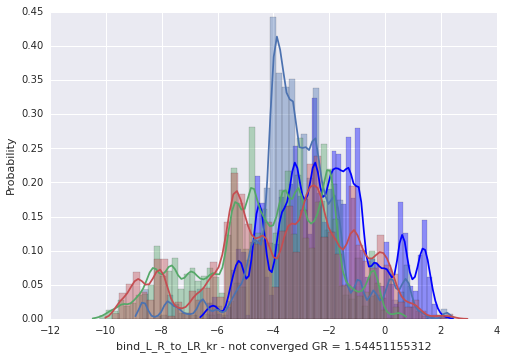

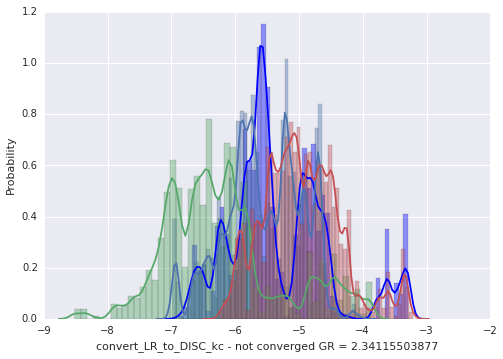

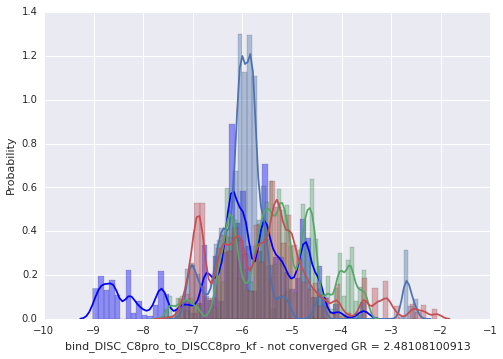

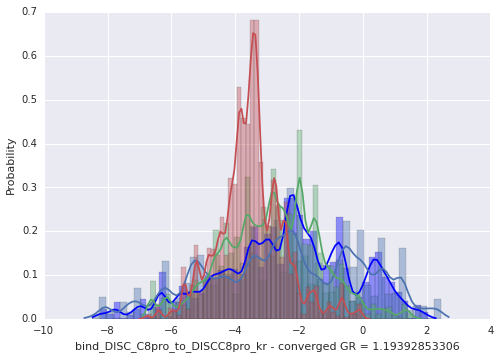

...

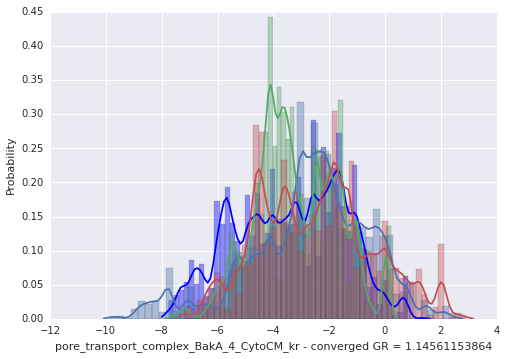

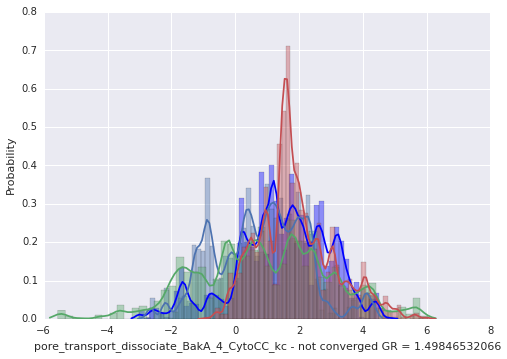

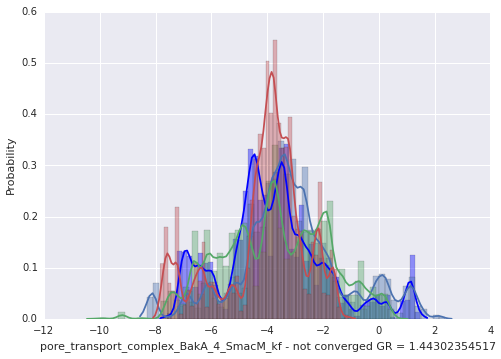

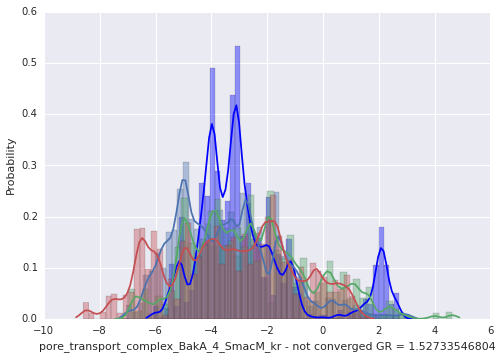

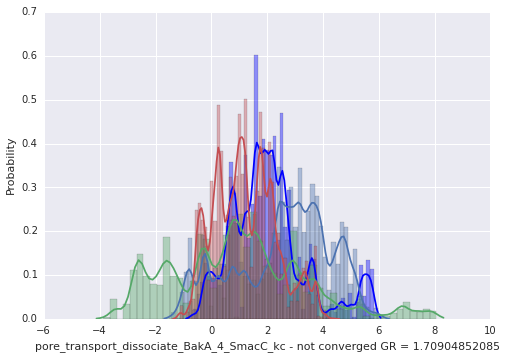

In [16]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

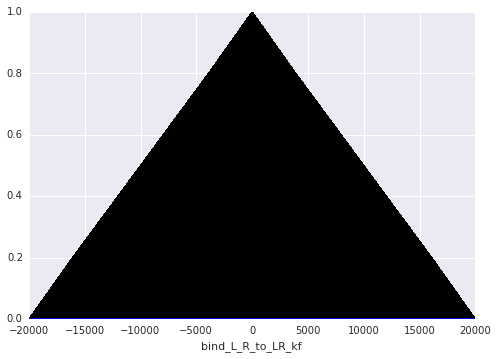

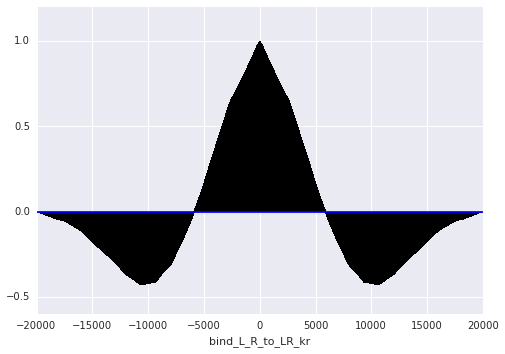

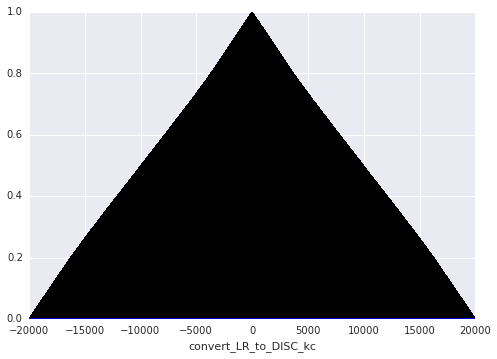

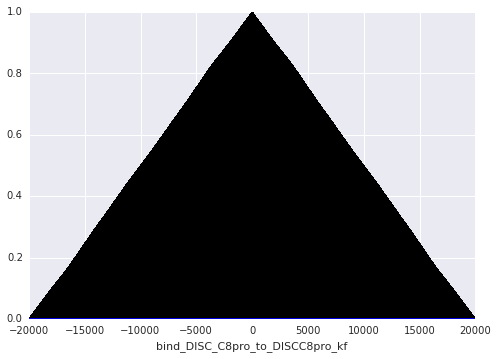

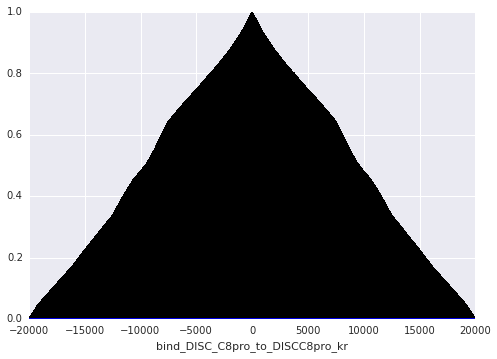

...

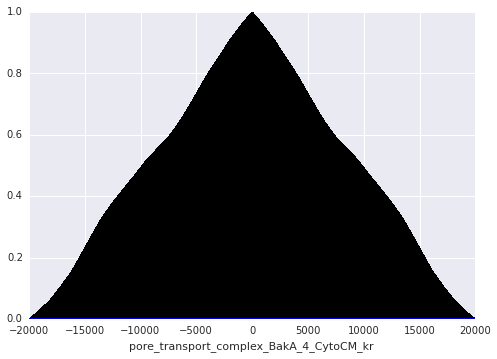

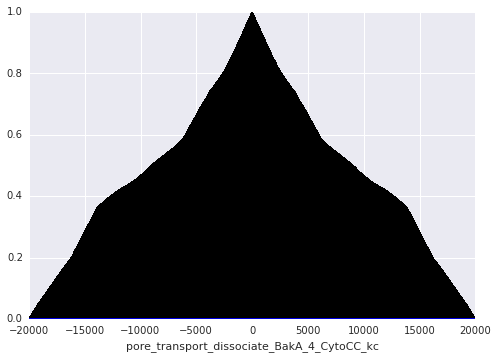

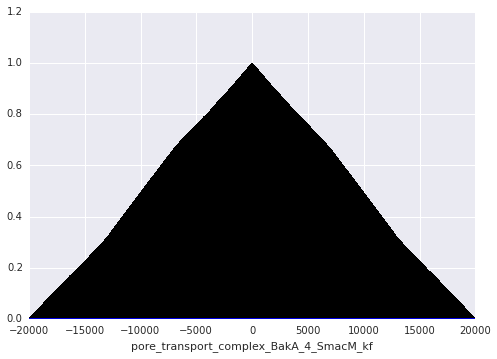

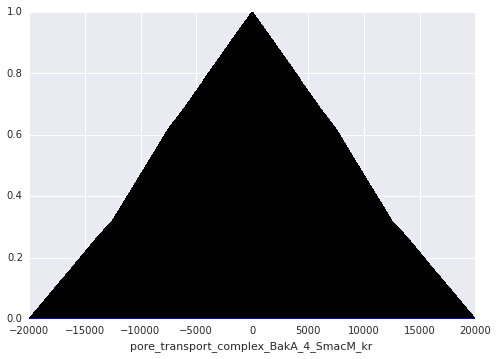

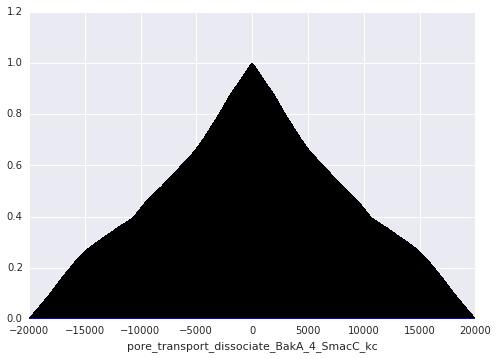

In [17]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][30000::,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)